In [44]:
import pandas as pd
dataframe=pd.read_csv('../data/raw/bar_pass_prediction.csv')

In [45]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22407 entries, 0 to 22406
Data columns (total 39 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   decile1b                 20803 non-null  float64
 1   decile3                  20803 non-null  float64
 2   ID                       22407 non-null  int64  
 3   decile1                  21315 non-null  float64
 4   sex                      22402 non-null  float64
 5   race                     22391 non-null  float64
 6   cluster                  22311 non-null  float64
 7   lsat                     22407 non-null  float64
 8   ugpa                     22407 non-null  float64
 9   zfygpa                   21423 non-null  float64
 10  DOB_yr                   22357 non-null  float64
 11  grad                     22404 non-null  object 
 12  zgpa                     21118 non-null  float64
 13  bar1                     22407 non-null  object 
 14  bar1_yr               

In [46]:
dataframe["ID"].nunique()

22407

Hay más columnas de las que el autor del reto en Kaggle menciona. El autor indica que las columnas importantes o las que dan más info son:

+ dnn_bar_pass_prediction: The LSAT prediction from the DNN model.

+ gender: Gender of the student.

+ lsat: LSAT score received by the student.

+ race: Race of the student.

+ ugpa: A student's undergraduate GPA.

+ pass_bar: - Ground truth label indicating whether or not the student eventually passed a bar.

+ bar_passed - I added a boolean target column for convenience, of whether someone passed the bar at any point

Las columnas "pass_bar" y "bar_passed" dan la misma info, solo que la ultima fue añadida por el autor en booleano. 

In [47]:
print(dataframe["pass_bar"])
dataframe["bar_passed"]

0        1
1        1
2        1
3        1
4        1
        ..
22402    0
22403    0
22404    1
22405    1
22406    1
Name: pass_bar, Length: 22407, dtype: int64


0         True
1         True
2         True
3         True
4         True
         ...  
22402    False
22403    False
22404     True
22405     True
22406     True
Name: bar_passed, Length: 22407, dtype: bool

In [48]:
print(dataframe["pass_bar"].value_counts())
print(dataframe["bar_passed"].value_counts())
print(dataframe["bar"].value_counts())

pass_bar
1    21238
0     1169
Name: count, dtype: int64
bar_passed
True     21237
False     1170
Name: count, dtype: int64
bar
a Passed 1st time    19839
b Passed 2nd time     1398
c Failed              1169
e non-Grad               1
Name: count, dtype: int64


Hay una fila en bar_passed que no se corresponde con la de pass_bar.

El objetivo de la competención en Kaggle es predecir lo mejor posible estas dos ultimas columnas, es decir, predecir quien pasa el examen y quien no.
Vamos a usar ese mismo objetivo. Por lo tanto, el modelo que creemos será de clasificación.

In [49]:
dataframe.describe(include="all")

,decile1b,decile3,ID,decile1,sex,race,cluster,lsat,ugpa,zfygpa,...,hisp,pass_bar,bar,bar_passed,tier,index6040,indxgrp,indxgrp2,dnn_bar_pass_prediction,gpa
count,20803.000000,20803.000000,22407.000000,21315.000000,22402.000000,22391.000000,22311.000000,22407.000000,22407.000000,21423.000000,...,22407.000000,22407.000000,22407,22407,22311.000000,22407.000000,22407,22407,22407.000000,22407.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,4,2,NaN,NaN,7,9,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,a Passed 1st time,True,NaN,NaN,g 700+,i 820+,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,19839,21237,NaN,NaN,15272,5241,NaN,NaN
mean,5.528481,5.525934,13768.253537,5.708234,1.561378,6.458354,2.817355,36.767907,3.215451,0.086068,...,0.004686,0.947829,NaN,NaN,3.768814,744.196203,NaN,NaN,0.980682,3.215451
std,2.854800,2.851286,7929.063192,2.783098,0.496229,1.433301,1.384079,5.463248,0.404073,0.928683,...,0.068296,0.222377,NaN,NaN,1.179375,103.770570,NaN,NaN,0.022594,0.404073
min,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,11.000000,1.500000,-3.350000,...,0.000000,0.000000,NaN,NaN,1.000000,288.947365,NaN,NaN,0.330740,1.500000
25%,3.000000,3.000000,6926.500000,3.000000,1.000000,7.000000,1.000000,33.000000,3.000000,-0.560000,...,0.000000,1.000000,NaN,NaN,3.000000,678.947352,NaN,NaN,0.971071,3.000000
50%,6.000000,6.000000,13772.000000,6.000000,2.000000,7.000000,3.000000,37.000000,3.200000,0.080000,...,0.000000,1.000000,NaN,NaN,4.000000,747.894717,NaN,NaN,0.983144,3.200000
75%,8.000000,8.000000,20628.500000,8.000000,2.000000,7.000000,4.000000,41.000000,3.500000,0.740000,...,0.000000,1.000000,NaN,NaN,5.000000,815.263136,NaN,NaN,0.996526,3.500000


Hay que ver los datos de cada columna:

In [50]:
for columna in dataframe.columns:
    print(dataframe[columna].value_counts())

decile1b
5.0     2121
7.0     2106
6.0     2102
9.0     2100
8.0     2096
3.0     2090
4.0     2081
10.0    2069
2.0     2060
1.0     1978
Name: count, dtype: int64
decile3
5.0     2122
4.0     2109
7.0     2107
6.0     2107
9.0     2106
3.0     2092
8.0     2081
10.0    2057
2.0     2049
1.0     1973
Name: count, dtype: int64
ID
2        1
23837    1
23988    1
23987    1
23977    1
        ..
17914    1
17889    1
17855    1
17846    1
10684    1
Name: count, Length: 22407, dtype: int64
decile1
7.0     2256
5.0     2255
9.0     2250
8.0     2244
6.0     2242
10.0    2221
4.0     2200
3.0     2147
2.0     1999
1.0     1501
Name: count, dtype: int64
sex
2.0    12576
1.0     9826
Name: count, dtype: int64
race
7.0    18716
3.0     1343
2.0      897
6.0      506
4.0      396
8.0      303
5.0      125
1.0      105
Name: count, dtype: int64
cluster
3.0    7991
1.0    6083
4.0    3895
5.0    2054
2.0    1694
6.0     594
Name: count, dtype: int64
lsat
37.0    1620
39.0    1537
40.0    1485
3

El histograma de todas las columnas numericas:

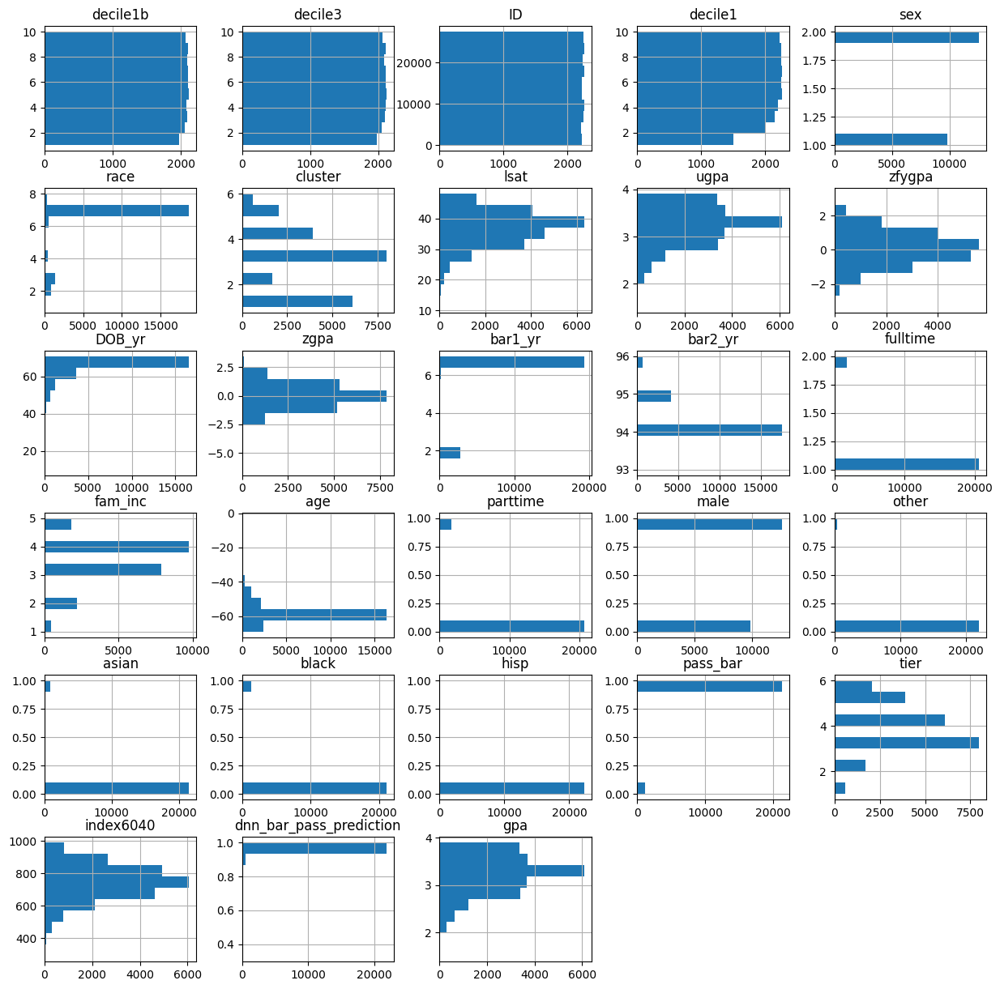

In [51]:
import matplotlib.pyplot as plt

dataframe.hist(orientation="horizontal",figsize=(15,15))
plt.show()

Para ver las que no son númericas, hay que ver las una por una:

In [52]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22407 entries, 0 to 22406
Data columns (total 39 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   decile1b                 20803 non-null  float64
 1   decile3                  20803 non-null  float64
 2   ID                       22407 non-null  int64  
 3   decile1                  21315 non-null  float64
 4   sex                      22402 non-null  float64
 5   race                     22391 non-null  float64
 6   cluster                  22311 non-null  float64
 7   lsat                     22407 non-null  float64
 8   ugpa                     22407 non-null  float64
 9   zfygpa                   21423 non-null  float64
 10  DOB_yr                   22357 non-null  float64
 11  grad                     22404 non-null  object 
 12  zgpa                     21118 non-null  float64
 13  bar1                     22407 non-null  object 
 14  bar1_yr               

<Axes: >

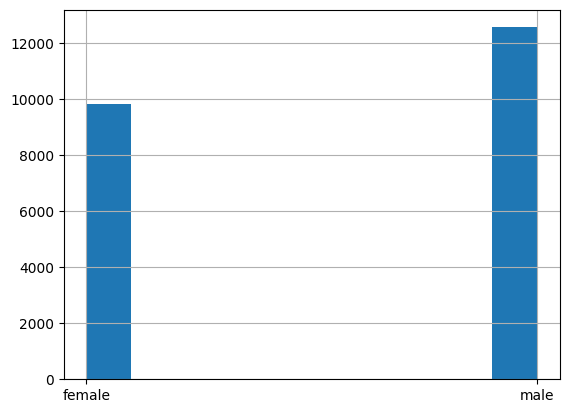

In [53]:
dataframe["gender"].hist()

<Axes: >

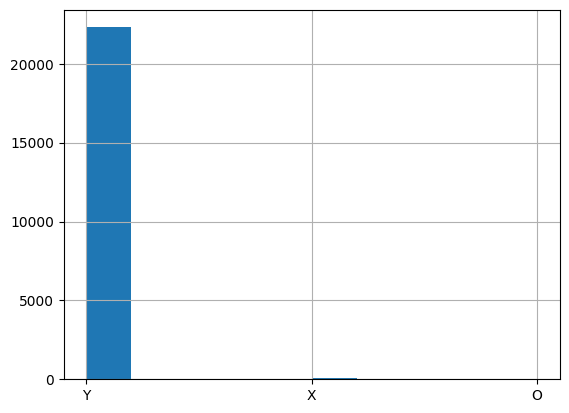

In [54]:
dataframe["grad"].hist()

<Axes: >

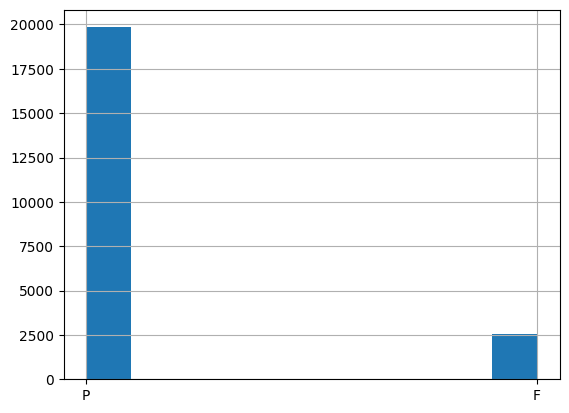

In [55]:
dataframe["bar1"].hist()


<Axes: >

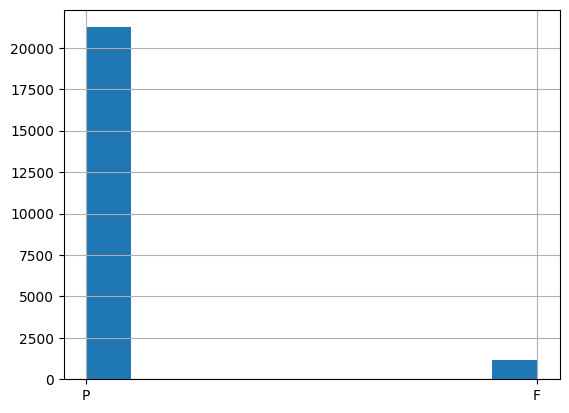

In [56]:
dataframe["bar2"].hist()

<Axes: >

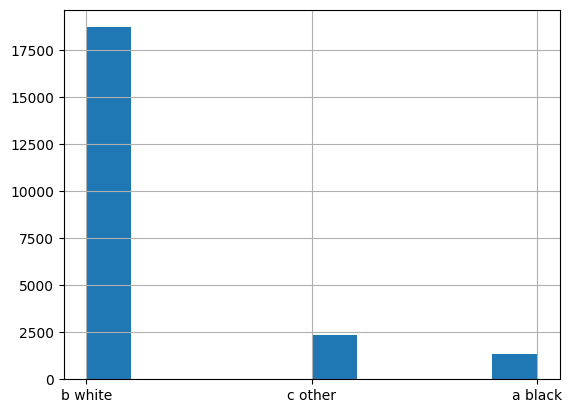

In [57]:
dataframe["race2"].hist()


<Axes: >

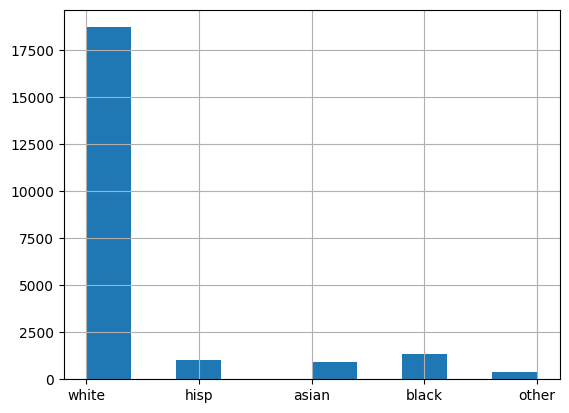

In [58]:
dataframe["race1"].hist()


<Axes: >

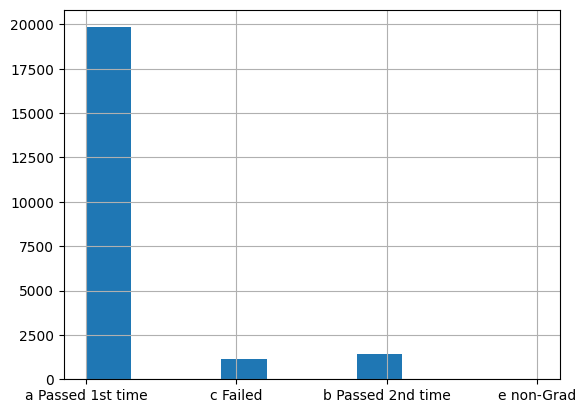

In [59]:
dataframe["bar"].hist()

<Axes: >

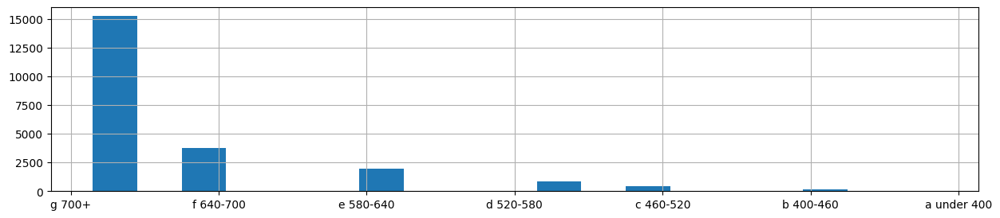

In [60]:
dataframe["indxgrp"].hist(rwidth=[0.5],figsize=(15,3))

<Axes: >

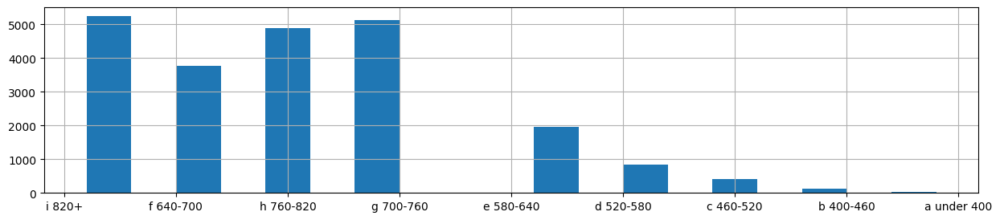

In [61]:
dataframe["indxgrp2"].hist(rwidth=[0.5],figsize=(15,3))

In [62]:
dataframe.isna().sum()

decile1b                   1604
decile3                    1604
ID                            0
decile1                    1092
sex                           5
race                         16
cluster                      96
lsat                          0
ugpa                          0
zfygpa                      984
DOB_yr                       50
grad                          3
zgpa                       1289
bar1                          0
bar1_yr                      39
bar2                          0
bar2_yr                      40
fulltime                     34
fam_inc                     289
age                          89
gender                        5
parttime                     34
male                          5
race1                        16
race2                        16
Dropout                       0
other                         0
asian                         0
black                         0
hisp                          0
pass_bar                      0
bar     

Vemos que hay muchas columnas con una relación conceptual entre ellas, que podríamos meter en un dataframe propio.

In [63]:
dataframe.columns

Index(['decile1b', 'decile3', 'ID', 'decile1', 'sex', 'race', 'cluster',
       'lsat', 'ugpa', 'zfygpa', 'DOB_yr', 'grad', 'zgpa', 'bar1', 'bar1_yr',
       'bar2', 'bar2_yr', 'fulltime', 'fam_inc', 'age', 'gender', 'parttime',
       'male', 'race1', 'race2', 'Dropout', 'other', 'asian', 'black', 'hisp',
       'pass_bar', 'bar', 'bar_passed', 'tier', 'index6040', 'indxgrp',
       'indxgrp2', 'dnn_bar_pass_prediction', 'gpa'],
      dtype='object')

In [64]:
dataframe_datos_academicos=dataframe.drop(["sex","race","gender","fam_inc","age","male","race1","race2","other","asian","black","hisp","dnn_bar_pass_prediction"],axis=1)
dataframe_datos_razaygeneroyclasesocial=dataframe.drop(['decile1b', 'decile3','decile1','lsat', 'ugpa', 'zfygpa', 'DOB_yr', 'grad', 'zgpa', 'bar1', 'bar1_yr','bar2', 'bar2_yr','pass_bar', 'bar', 'bar_passed', 'tier', 'index6040', 'indxgrp','indxgrp2', 'dnn_bar_pass_prediction', 'gpa'],axis=1)
dataframe_numerico=dataframe.drop(["grad","bar1","bar2","gender","race1","race2","Dropout","bar","bar_passed","indxgrp","indxgrp2"],axis=1)

Viendo la correlación de las columnas con datos númericos podemos extraer que significan algunas columnas, aparte de las que explico el autor de la competición en Kaggle. Además, tambien podemos ir quitando columnas que repiten info "repetida" o con demasiada correlación con otras y centrarnos en la que nos dan más info.

<Axes: >

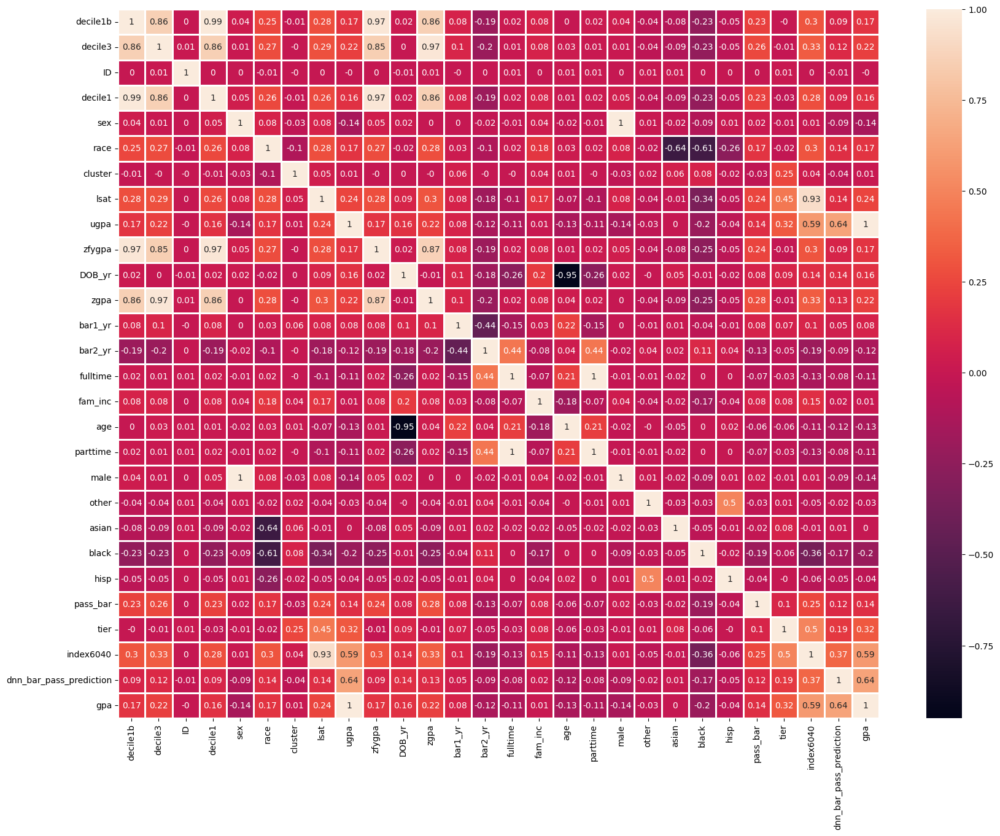

In [65]:
import seaborn as sns
plt.subplots(figsize=(20,15))
sns.heatmap(dataframe_numerico.corr().round(2),linewidths=1,annot=True)

In [66]:
dataframe_numerico.corr()[dataframe_numerico.corr() > 0.1]

,decile1b,decile3,ID,decile1,sex,race,cluster,lsat,ugpa,zfygpa,...,male,other,asian,black,hisp,pass_bar,tier,index6040,dnn_bar_pass_prediction,gpa
decile1b,1.000000,0.864000,NaN,0.990840,NaN,0.254074,NaN,0.275698,0.172168,0.972201,...,NaN,NaN,NaN,NaN,NaN,0.233882,NaN,0.297639,NaN,0.172168
decile3,0.864000,1.000000,NaN,0.862383,NaN,0.272404,NaN,0.288307,0.218472,0.852783,...,NaN,NaN,NaN,NaN,NaN,0.261553,NaN,0.326368,0.124081,0.218472
ID,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
decile1,0.990840,0.862383,NaN,1.000000,NaN,0.259943,NaN,0.264824,0.164697,0.974492,...,NaN,NaN,NaN,NaN,NaN,0.233723,NaN,0.284907,NaN,0.164697
sex,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
race,0.254074,0.272404,NaN,0.259943,NaN,1.000000,NaN,0.284473,0.169508,0.271426,...,NaN,NaN,NaN,NaN,NaN,0.174805,NaN,0.302454,0.137335,0.169508
cluster,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.252924,NaN,NaN,NaN
lsat,0.275698,0.288307,NaN,0.264824,NaN,0.284473,NaN,1.000000,0.243069,0.281868,...,NaN,NaN,NaN,NaN,NaN,0.238447,0.450824,0.925923,0.142550,0.243069
ugpa,0.172168,0.218472,NaN,0.164697,NaN,0.169508,NaN,0.243069,1.000000,0.173866,...,NaN,NaN,NaN,NaN,NaN,0.143276,0.320255,0.591448,0.635371,1.000000
zfygpa,0.972201,0.852783,NaN,0.974492,NaN,0.271426,NaN,0.281868,0.173866,1.000000,...,NaN,NaN,NaN,NaN,NaN,0.243983,NaN,0.302332,NaN,0.173866


LSAT es el examen de admisión en la facultad de Derecho (Law School) ¿De estos datos podriamos sacar más info? Podriamos pero eso implicaria crear más columnas a partir de esta con info que ya tenemos en parte con las columnas ya existentes.

Parece que lsat es muy importante para el target pass_bar.

In [67]:
dataframe["lsat"].corr(dataframe["pass_bar"])

0.2384470123211039

In [68]:
dataframe["lsat"].head()

0    44.0
1    29.0
2    36.0
3    39.0
4    48.0
Name: lsat, dtype: float64

In [69]:
dataframe["lsat"].describe()

count    22407.000000
mean        36.767907
std          5.463248
min         11.000000
25%         33.000000
50%         37.000000
75%         41.000000
max         48.000000
Name: lsat, dtype: float64

<Axes: xlabel='lsat', ylabel='Density'>

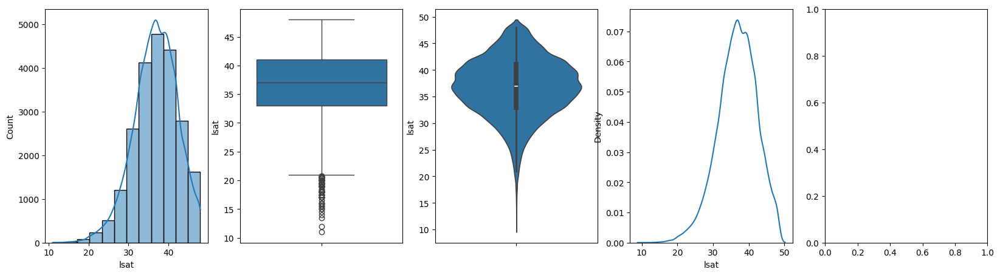

In [70]:
fig, (ax0, ax1, ax2, ax3,ax4) = plt.subplots(1, 5, figsize=(20, 5))

sns.histplot(dataframe["lsat"],bins=12,kde=True,ax=ax0)

sns.boxplot(dataframe["lsat"],ax=ax1)
sns.violinplot(dataframe["lsat"],ax=ax2)
sns.kdeplot(data=dataframe["lsat"], ax=ax3)

Datos académicos

In [71]:
dataframe_datos_academicos

,decile1b,decile3,ID,decile1,cluster,lsat,ugpa,zfygpa,DOB_yr,grad,...,parttime,Dropout,pass_bar,bar,bar_passed,tier,index6040,indxgrp,indxgrp2,gpa
0,10.0,10.0,2,10.0,1.0,44.0,3.5,1.33,69.0,Y,...,0.0,NO,1,a Passed 1st time,True,4.0,886.842082,g 700+,i 820+,3.5
1,5.0,4.0,3,5.0,2.0,29.0,3.5,-0.11,69.0,Y,...,0.0,NO,1,a Passed 1st time,True,2.0,649.999987,f 640-700,f 640-700,3.5
2,3.0,2.0,36,3.0,3.0,36.0,3.5,-0.64,65.0,Y,...,0.0,NO,1,a Passed 1st time,True,3.0,760.526298,g 700+,h 760-820,3.5
3,7.0,4.0,52,7.0,3.0,39.0,3.5,0.34,58.0,Y,...,0.0,NO,1,a Passed 1st time,True,3.0,807.894717,g 700+,h 760-820,3.5
4,9.0,8.0,55,9.0,4.0,48.0,3.5,1.02,68.0,Y,...,0.0,NO,1,a Passed 1st time,True,5.0,949.999974,g 700+,i 820+,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22402,3.0,1.0,10695,3.0,6.0,26.5,1.8,-0.58,64.0,Y,...,0.0,NO,0,c Failed,False,1.0,440.526304,b 400-460,b 400-460,1.8
22403,2.0,1.0,19642,3.0,6.0,19.7,1.8,-0.64,64.0,Y,...,0.0,NO,0,c Failed,False,1.0,333.157888,a under 400,a under 400,1.8
22404,7.0,8.0,24704,7.0,3.0,36.0,1.8,0.41,66.0,Y,...,1.0,NO,1,a Passed 1st time,True,3.0,590.526298,e 580-640,e 580-640,1.8
22405,10.0,10.0,10000,10.0,3.0,44.0,1.5,1.88,58.0,Y,...,1.0,NO,1,a Passed 1st time,True,3.0,686.842082,f 640-700,f 640-700,1.5


Tambien muy relacionado con la columna target de pass_bar, aparte de lsat tenemos el gpa (hay dos columnas, zgpa y zygpa es ugpa pero con valores normalizados)

In [29]:
print(dataframe_datos_academicos["zgpa"])
print(dataframe_datos_academicos["zfygpa"])
dataframe_datos_academicos["ugpa"]

0        1.88
1       -0.57
2       -1.12
3       -0.49
4        0.76
         ... 
22402   -1.49
22403   -1.36
22404    0.80
22405    1.42
22406    0.81
Name: zgpa, Length: 22407, dtype: float64
0        1.33
1       -0.11
2       -0.64
3        0.34
4        1.02
         ... 
22402   -0.58
22403   -0.64
22404    0.41
22405    1.88
22406    1.10
Name: zfygpa, Length: 22407, dtype: float64


0        3.5
1        3.5
2        3.5
3        3.5
4        3.5
        ... 
22402    1.8
22403    1.8
22404    1.8
22405    1.5
22406    1.6
Name: ugpa, Length: 22407, dtype: float64

<Axes: xlabel='zgpa', ylabel='Count'>

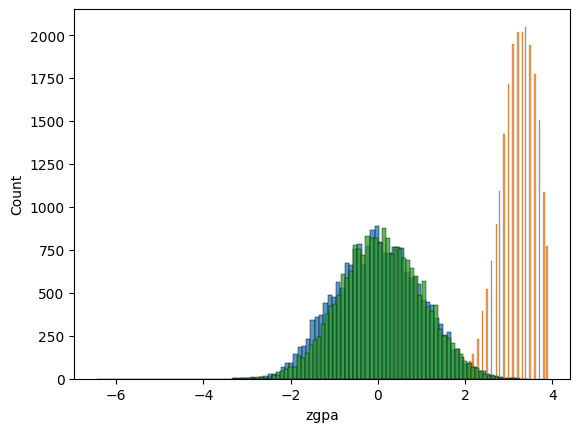

In [30]:
sns.histplot(dataframe_datos_academicos["zgpa"])
sns.histplot(dataframe_datos_academicos["ugpa"])
sns.histplot(dataframe_datos_academicos["zfygpa"])

Datos de raza, género y clase social (datos controversiales)

In [31]:
dataframe_datos_razaygeneroyclasesocial

,ID,sex,race,cluster,fulltime,fam_inc,age,gender,parttime,male,race1,race2,Dropout,other,asian,black,hisp
0,2,1.0,7.0,1.0,1.0,5.0,-62.0,female,0.0,0.0,white,b white,NO,0,0,0,0
1,3,1.0,7.0,2.0,1.0,4.0,-62.0,female,0.0,0.0,white,b white,NO,0,0,0,0
2,36,2.0,7.0,3.0,1.0,1.0,-58.0,male,0.0,1.0,white,b white,NO,0,0,0,0
3,52,2.0,7.0,3.0,1.0,4.0,-51.0,male,0.0,1.0,white,b white,NO,0,0,0,0
4,55,2.0,7.0,4.0,1.0,4.0,-61.0,male,0.0,1.0,white,b white,NO,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22402,10695,2.0,3.0,6.0,1.0,2.0,-62.0,male,0.0,1.0,black,a black,NO,0,0,1,0
22403,19642,2.0,3.0,6.0,1.0,3.0,-57.0,male,0.0,1.0,black,a black,NO,0,0,1,0
22404,24704,2.0,3.0,3.0,2.0,3.0,-59.0,male,1.0,1.0,black,a black,NO,0,0,1,0
22405,10000,2.0,7.0,3.0,2.0,3.0,-51.0,male,1.0,1.0,white,b white,NO,0,0,0,0


Vemos que hay una mayoria de gente blanca.

<Axes: xlabel='race1', ylabel='Count'>

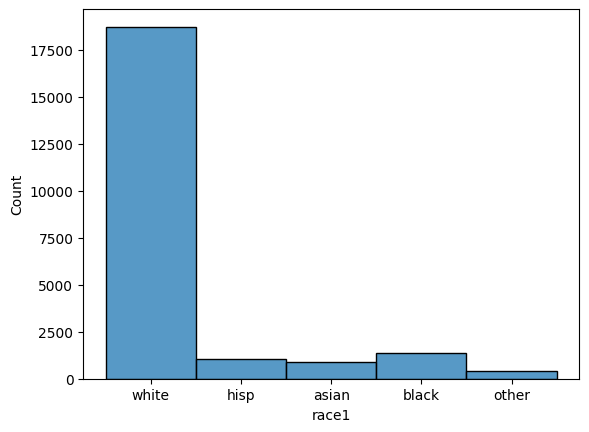

In [32]:
sns.histplot(dataframe_datos_razaygeneroyclasesocial["race1"])

([<matplotlib.patches.Wedge at 0x248d4bc5360>,
 [Text(-0.9569833812636165, 0.5423862166254372, 'white'),
  Text(0.7318977285902839, -0.8211733768726208, 'hisp'),
  Text(0.9598616084646272, -0.5372761790696651, 'asian'),
  Text(1.0683817335611432, -0.2618405457389794, 'black'),
  Text(1.098198165501013, -0.06293480190014183, 'other')],
 [Text(-0.5219909352346999, 0.2958470272502384, '83.6%'),
  Text(0.39921694286742754, -0.44791275102142947, '6.0%'),
  Text(0.5235608773443421, -0.2930597340379991, '4.6%'),
  Text(0.5827536728515326, -0.14282211585762514, '4.0%'),
  Text(0.5990171811823706, -0.034328073763713725, '1.8%')])

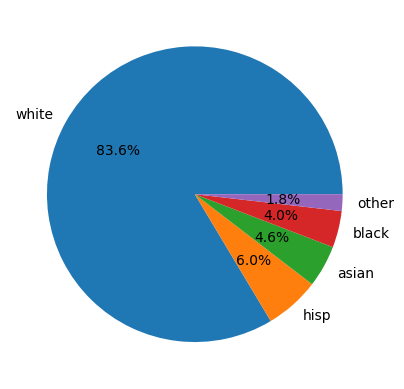

In [33]:
plt.pie(dataframe_datos_razaygeneroyclasesocial["race1"].value_counts(),labels=['white', 'hisp', 'asian', 'black', 'other'], autopct='%1.1f%%')

En cuanto a género, vemos que hay más hombres que mujeres aunque la diferencia no es tan grande.

([<matplotlib.patches.Wedge at 0x248d4c210c0>,
 [Text(-0.21079660001803247, 1.079613261043434, 'male'),
  Text(0.2107964989373427, -1.0796132807796313, 'female')],
 [Text(-0.11497996364619952, 0.5888799605691457, '56.1%'),
  Text(0.11497990851127782, -0.5888799713343443, '43.9%')])

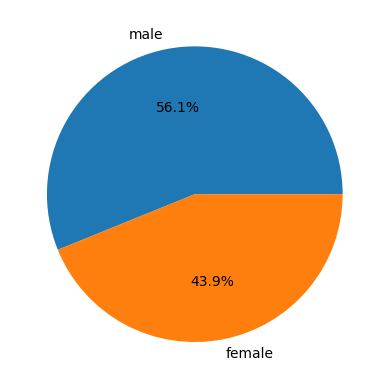

In [34]:
plt.pie(dataframe_datos_razaygeneroyclasesocial["gender"].value_counts(),labels=["male","female"], autopct='%1.1f%%')

Ahora veamos las clases sociales, es decir, vamos usar las columnas de fam_inc (en principio, esta columna agrupa a los alumnos en grupos según las rentas de su familia). Para saber que significa 1.0-5.0 tenemos que verlo más en profundidad. El que este dividido en cinco grupos puede significar que este en quintiles. Asumamos esto porque el pdf no nos da mucha info sobre esto.

<Axes: xlabel='fam_inc', ylabel='Count'>

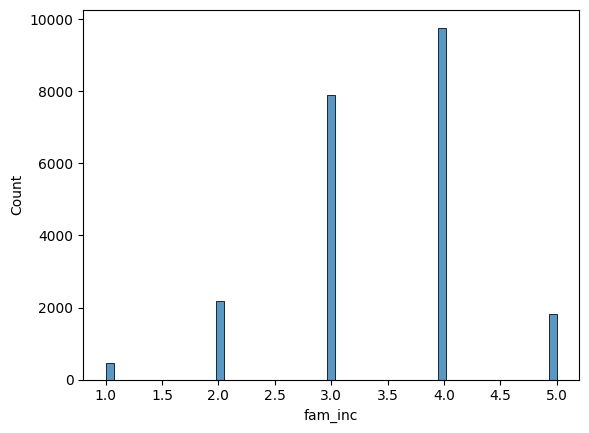

In [35]:
sns.histplot(dataframe_datos_razaygeneroyclasesocial["fam_inc"])

In [36]:
dataframe_datos_academicos["pass_bar"].corr(dataframe_datos_razaygeneroyclasesocial["fam_inc"])

0.08005013307764032

Vemos que la columna cluster, según el pdf pág. 12 (nota a pie de página 20), son grupos de 1.0-6.0 de alumnos según la Law School a la que fueron. Las de 1.0 son las "mejores" (matriculas caras, menor porcentaje de alumnos parte de una minoria, mayor gpa medio, etc.) y las de 6.0 "peores".

<Axes: xlabel='cluster', ylabel='Count'>

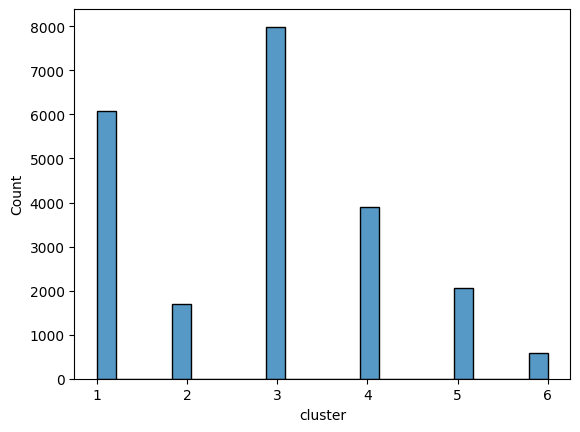

In [37]:
sns.histplot(dataframe_datos_razaygeneroyclasesocial["cluster"])

In [38]:
dataframe_datos_razaygeneroyclasesocial["cluster"].corr(dataframe_datos_academicos["pass_bar"])

-0.034830375852578956

Una vez visto algunas columnas interesantes aparte de las que indico el autor de la competención en Kaggle, tenemos que limpiar. Veamos otra vez los NaN.º

In [39]:
dataframe.isna().sum()

decile1b                   1604
decile3                    1604
ID                            0
decile1                    1092
sex                           5
race                         16
cluster                      96
lsat                          0
ugpa                          0
zfygpa                      984
DOB_yr                       50
grad                          3
zgpa                       1289
bar1                          0
bar1_yr                      39
bar2                          0
bar2_yr                      40
fulltime                     34
fam_inc                     289
age                          89
gender                        5
parttime                     34
male                          5
race1                        16
race2                        16
Dropout                       0
other                         0
asian                         0
black                         0
hisp                          0
pass_bar                      0
bar     

Veamos cuantos quedan si los quitamos, si no, veremos formas de imputar esos datos.

In [40]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22407 entries, 0 to 22406
Data columns (total 39 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   decile1b                 20803 non-null  float64
 1   decile3                  20803 non-null  float64
 2   ID                       22407 non-null  int64  
 3   decile1                  21315 non-null  float64
 4   sex                      22402 non-null  float64
 5   race                     22391 non-null  float64
 6   cluster                  22311 non-null  float64
 7   lsat                     22407 non-null  float64
 8   ugpa                     22407 non-null  float64
 9   zfygpa                   21423 non-null  float64
 10  DOB_yr                   22357 non-null  float64
 11  grad                     22404 non-null  object 
 12  zgpa                     21118 non-null  float64
 13  bar1                     22407 non-null  object 
 14  bar1_yr               

In [41]:
dataframe_sinna=dataframe.dropna()
dataframe_sinna.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20427 entries, 0 to 22406
Data columns (total 39 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   decile1b                 20427 non-null  float64
 1   decile3                  20427 non-null  float64
 2   ID                       20427 non-null  int64  
 3   decile1                  20427 non-null  float64
 4   sex                      20427 non-null  float64
 5   race                     20427 non-null  float64
 6   cluster                  20427 non-null  float64
 7   lsat                     20427 non-null  float64
 8   ugpa                     20427 non-null  float64
 9   zfygpa                   20427 non-null  float64
 10  DOB_yr                   20427 non-null  float64
 11  grad                     20427 non-null  object 
 12  zgpa                     20427 non-null  float64
 13  bar1                     20427 non-null  object 
 14  bar1_yr                  20

Eliminando directamente los NaN quitamos 2000 datos de una vez. Es una posibilidad pero intentemos seleccionar las columnas que nos interesan y luego imputamos.

<Axes: >

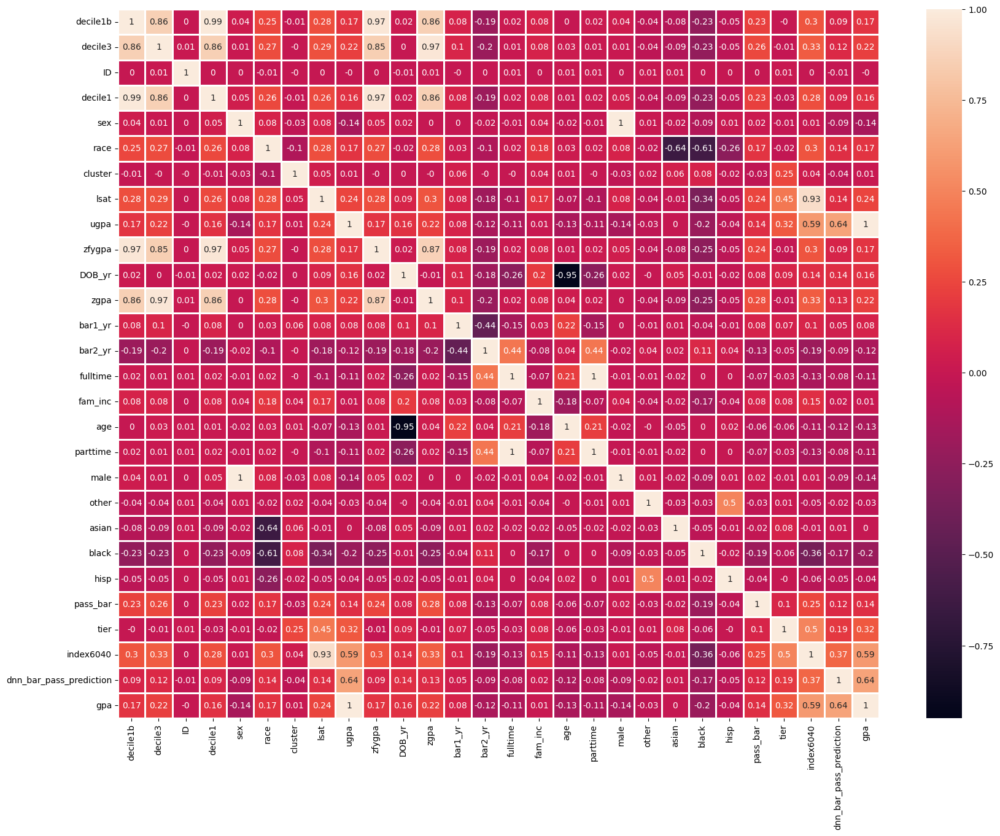

In [42]:
plt.subplots(figsize=(20,15))
sns.heatmap(dataframe_numerico.corr().round(2),linewidths=1,annot=True)

In [43]:
dataframe_numerico.corr()[dataframe_numerico.corr() > 0.8]

,decile1b,decile3,ID,decile1,sex,race,cluster,lsat,ugpa,zfygpa,...,male,other,asian,black,hisp,pass_bar,tier,index6040,dnn_bar_pass_prediction,gpa
decile1b,1.000000,0.864000,NaN,0.990840,NaN,NaN,NaN,NaN,NaN,0.972201,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
decile3,0.864000,1.000000,NaN,0.862383,NaN,NaN,NaN,NaN,NaN,0.852783,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ID,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
decile1,0.990840,0.862383,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,0.974492,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sex,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
race,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
cluster,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
lsat,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.925923,NaN,NaN
ugpa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
zfygpa,0.972201,0.852783,NaN,0.974492,NaN,NaN,NaN,NaN,NaN,1.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


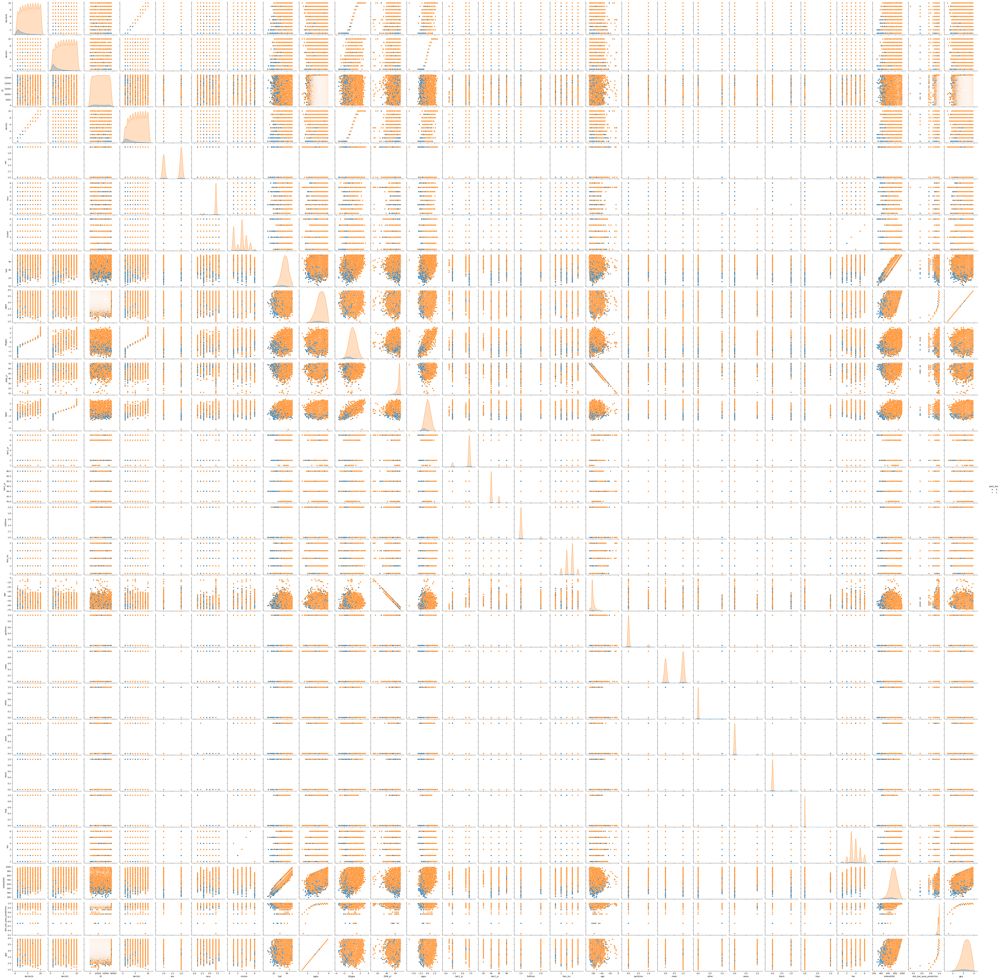

In [72]:
import seaborn as sns
sns.pairplot(dataframe_numerico,
            hue='pass_bar',
            diag_kind="kde");

In [44]:
dataframe.columns

Index(['decile1b', 'decile3', 'ID', 'decile1', 'sex', 'race', 'cluster',
       'lsat', 'ugpa', 'zfygpa', 'DOB_yr', 'grad', 'zgpa', 'bar1', 'bar1_yr',
       'bar2', 'bar2_yr', 'fulltime', 'fam_inc', 'age', 'gender', 'parttime',
       'male', 'race1', 'race2', 'Dropout', 'other', 'asian', 'black', 'hisp',
       'pass_bar', 'bar', 'bar_passed', 'tier', 'index6040', 'indxgrp',
       'indxgrp2', 'dnn_bar_pass_prediction', 'gpa'],
      dtype='object')

In [45]:
dataframe["indxgrp"].value_counts()

indxgrp
g 700+         15272
f 640-700       3781
e 580-640       1950
d 520-580        829
c 460-520        407
b 400-460        129
a under 400       39
Name: count, dtype: int64

indxgrp parece que es info sobre algún tipo de examen adicional. Esto no lo pone en el pdf, sin embargo, podría tratarse del examen SAT o ACT que toman los universitarios en EEUU. En todo caso, vamos a ver que la correlación con el target es muy alta.

In [46]:
dataframe["indxgrp"]
dataframe["indxgrp2"].value_counts()

indxgrp2
i 820+         5241
g 700-760      5129
h 760-820      4902
f 640-700      3781
e 580-640      1950
d 520-580       829
c 460-520       407
b 400-460       129
a under 400      39
Name: count, dtype: int64

Vamos a ponerle números desde ya para que podamos ver la correlación que tienen con el target y despues para entrenar el modelo.

In [47]:
dataframe["indxgrp"]=dataframe["indxgrp"].replace({'g 700+': 7, 'f 640-700': 6, 'e 580-640': 5, 'd 520-580': 4, 'c 460-520': 3, 'b 400-460': 2, 'a under 400': 1})
dataframe["indxgrp2"]=dataframe["indxgrp"].replace({'i 820+':8, 'g 700-760': 7, 'f 640-700': 6, 'e 580-640': 5, 'd 520-580': 4, 'c 460-520': 3, 'b 400-460': 2, 'a under 400': 1})

C:\Users\traba\AppData\Local\Temp\ipykernel_7908\1016805320.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  dataframe["indxgrp"]=dataframe["indxgrp"].replace({'g 700+': 7, 'f 640-700': 6, 'e 580-640': 5, 'd 520-580': 4, 'c 460-520': 3, 'b 400-460': 2, 'a under 400': 1})


In [48]:
dataframe["indxgrp"].corr(dataframe["pass_bar"])

0.29085871768449023

In [49]:
dataframe["indxgrp2"].corr(dataframe["pass_bar"])

0.29085871768449023

In [50]:
dataframe["DOB_yr"].describe()

count    22357.000000
mean        65.440712
std          5.207162
min         10.000000
25%         64.000000
50%         67.000000
75%         69.000000
max         71.000000
Name: DOB_yr, dtype: float64

In [51]:
dataframe["age"].describe()

count    22318.000000
mean       -59.082893
std          5.311722
min        -69.000000
25%        -62.000000
50%        -61.000000
75%        -58.000000
max         -3.000000
Name: age, dtype: float64

Vamos a quitar deciles (que son formas de dividir en 10 partes iguales los valores del dataframe), index6040 y zfygpa (que ambas son otras formas de indicar la info de lsat y ugpa y zgpa, tal como indica sus correlación). Tambien vamos a quitar las columnas de DOB_yr y age porque no tienen sentido si se refieren a la edad o el año de nacimiento de los alumnos.
Por último, los datos de bar y bar_passed da la misma info que pass_bar, y las demás columnas: bar1,bar2,bar1_yr y bar2_yr nos da info solamente sobre cuando el alumno aprueba, lo cual puede ser interesante tenerlo pero nos limitaremos a ver si pasa o no el exámen.

In [52]:
dataframe=dataframe.drop(["decile1b","decile3","decile1","index6040","zfygpa","age","DOB_yr","bar","bar1","bar2","bar1_yr","bar2_yr","bar_passed"],axis=1)

In [53]:
dataframe["grad"].value_counts()

grad
Y    22315
X       88
O        1
Name: count, dtype: int64

In [54]:
dataframe

,ID,sex,race,cluster,lsat,ugpa,grad,zgpa,fulltime,fam_inc,...,other,asian,black,hisp,pass_bar,tier,indxgrp,indxgrp2,dnn_bar_pass_prediction,gpa
0,2,1.0,7.0,1.0,44.0,3.5,Y,1.88,1.0,5.0,...,0,0,0,0,1,4.0,7,7,0.979804,3.5
1,3,1.0,7.0,2.0,29.0,3.5,Y,-0.57,1.0,4.0,...,0,0,0,0,1,2.0,6,6,0.979804,3.5
2,36,2.0,7.0,3.0,36.0,3.5,Y,-1.12,1.0,1.0,...,0,0,0,0,1,3.0,7,7,0.979804,3.5
3,52,2.0,7.0,3.0,39.0,3.5,Y,-0.49,1.0,4.0,...,0,0,0,0,1,3.0,7,7,0.979804,3.5
4,55,2.0,7.0,4.0,48.0,3.5,Y,0.76,1.0,4.0,...,0,0,0,0,1,5.0,7,7,0.979804,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22402,10695,2.0,3.0,6.0,26.5,1.8,Y,-1.49,1.0,2.0,...,0,0,1,0,0,1.0,2,2,0.557568,1.8
22403,19642,2.0,3.0,6.0,19.7,1.8,Y,-1.36,1.0,3.0,...,0,0,1,0,0,1.0,1,1,0.557568,1.8
22404,24704,2.0,3.0,3.0,36.0,1.8,Y,0.80,2.0,3.0,...,0,0,1,0,1,3.0,5,5,0.557568,1.8
22405,10000,2.0,7.0,3.0,44.0,1.5,Y,1.42,2.0,3.0,...,0,0,0,0,1,3.0,6,6,0.759128,1.5


In [55]:
dataframe_sinna=dataframe.dropna()
dataframe_sinna

,ID,sex,race,cluster,lsat,ugpa,grad,zgpa,fulltime,fam_inc,...,other,asian,black,hisp,pass_bar,tier,indxgrp,indxgrp2,dnn_bar_pass_prediction,gpa
0,2,1.0,7.0,1.0,44.0,3.5,Y,1.88,1.0,5.0,...,0,0,0,0,1,4.0,7,7,0.979804,3.5
1,3,1.0,7.0,2.0,29.0,3.5,Y,-0.57,1.0,4.0,...,0,0,0,0,1,2.0,6,6,0.979804,3.5
2,36,2.0,7.0,3.0,36.0,3.5,Y,-1.12,1.0,1.0,...,0,0,0,0,1,3.0,7,7,0.979804,3.5
3,52,2.0,7.0,3.0,39.0,3.5,Y,-0.49,1.0,4.0,...,0,0,0,0,1,3.0,7,7,0.979804,3.5
4,55,2.0,7.0,4.0,48.0,3.5,Y,0.76,1.0,4.0,...,0,0,0,0,1,5.0,7,7,0.979804,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22402,10695,2.0,3.0,6.0,26.5,1.8,Y,-1.49,1.0,2.0,...,0,0,1,0,0,1.0,2,2,0.557568,1.8
22403,19642,2.0,3.0,6.0,19.7,1.8,Y,-1.36,1.0,3.0,...,0,0,1,0,0,1.0,1,1,0.557568,1.8
22404,24704,2.0,3.0,3.0,36.0,1.8,Y,0.80,2.0,3.0,...,0,0,1,0,1,3.0,5,5,0.557568,1.8
22405,10000,2.0,7.0,3.0,44.0,1.5,Y,1.42,2.0,3.0,...,0,0,0,0,1,3.0,6,6,0.759128,1.5


Vamos a imputar datos, fijandonos primero en los más controversiales y luego con los de carácter más númerico.

In [56]:
dataframe.columns

Index(['ID', 'sex', 'race', 'cluster', 'lsat', 'ugpa', 'grad', 'zgpa',
       'fulltime', 'fam_inc', 'gender', 'parttime', 'male', 'race1', 'race2',
       'Dropout', 'other', 'asian', 'black', 'hisp', 'pass_bar', 'tier',
       'indxgrp', 'indxgrp2', 'dnn_bar_pass_prediction', 'gpa'],
      dtype='object')

In [57]:
dataframe.isnull().sum()

ID                            0
sex                           5
race                         16
cluster                      96
lsat                          0
ugpa                          0
grad                          3
zgpa                       1289
fulltime                     34
fam_inc                     289
gender                        5
parttime                     34
male                          5
race1                        16
race2                        16
Dropout                       0
other                         0
asian                         0
black                         0
hisp                          0
pass_bar                      0
tier                         96
indxgrp                       0
indxgrp2                      0
dnn_bar_pass_prediction       0
gpa                           0
dtype: int64

Vemos que en el caso de raza, los casos de NaN, en las otras columnas nos dan negativo (0) respecto a otraz razas aparte de la gente blanca (alrededor de 3/4 de los alumnos). Por lo tanto, podriamos imputar haciendo que su raza sea blanca.

In [58]:
dataframe[dataframe["race"].isnull() & dataframe["race1"].isnull() & dataframe["race2"].isnull()]

,ID,sex,race,cluster,lsat,ugpa,grad,zgpa,fulltime,fam_inc,...,other,asian,black,hisp,pass_bar,tier,indxgrp,indxgrp2,dnn_bar_pass_prediction,gpa
184,2703,2.0,NaN,1.0,45.0,3.5,Y,0.95,1.0,NaN,...,0,0,0,0,1,4.0,7,7,0.979804,3.5
1292,18295,NaN,NaN,4.0,42.0,3.5,Y,0.72,1.0,NaN,...,0,0,0,0,1,5.0,7,7,0.979804,3.5
3498,20585,2.0,NaN,3.0,39.0,3.4,Y,0.71,1.0,NaN,...,0,0,0,0,1,3.0,7,7,0.998464,3.4
8235,5313,2.0,NaN,1.0,48.0,2.4,Y,NaN,1.0,3.0,...,0,0,0,0,1,4.0,7,7,0.943293,2.4
9152,9257,2.0,NaN,5.0,44.0,3.6,Y,0.29,1.0,4.0,...,0,0,0,0,1,6.0,7,7,0.999319,3.6
9542,15586,1.0,NaN,5.0,48.0,3.6,Y,1.27,NaN,NaN,...,0,0,0,0,1,6.0,7,7,0.999319,3.6
10613,5052,2.0,NaN,3.0,43.0,2.9,Y,NaN,1.0,3.0,...,0,0,0,0,1,3.0,7,7,0.967757,2.9
14731,20300,1.0,NaN,4.0,35.0,3.7,Y,0.28,1.0,4.0,...,0,0,0,0,1,5.0,7,7,0.983144,3.7
14783,21315,2.0,NaN,5.0,48.0,3.7,Y,0.00,1.0,4.0,...,0,0,0,0,1,6.0,7,7,0.983144,3.7
14881,22929,2.0,NaN,5.0,44.0,3.7,Y,0.97,1.0,5.0,...,0,0,0,0,1,6.0,7,7,0.983144,3.7


Vemos que race esta dividido en 8 grupos, seguramente los grupos de la race1 especificando los que se encontrarían en el grupo de other. Esto complica las cosas, creo que lo mejor será mantener el de race 1 para saber de que grupos estamos hablando. 

In [59]:
print(dataframe["race"].value_counts())
print(dataframe["race2"].value_counts())
dataframe["race1"].value_counts()

race
7.0    18716
3.0     1343
2.0      897
6.0      506
4.0      396
8.0      303
5.0      125
1.0      105
Name: count, dtype: int64
race2
b white    18716
c other     2332
a black     1343
Name: count, dtype: int64


race1
white    18716
black     1343
hisp      1027
asian      897
other      408
Name: count, dtype: int64

In [60]:
dataframe=dataframe.drop(["race","race2"],axis=1)

In [61]:
dataframe["race1"][dataframe["race1"].isnull()]="white"

C:\Users\traba\AppData\Local\Temp\ipykernel_7908\874335450.py:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  dataframe["race1"][dataframe["race1"].isnull()]="white"
C:\Users\traba\AppData\Local\Temp\ipykernel_7908\874335450.py:1: SettingWi

In [62]:
dataframe["race1"].value_counts()

race1
white    18732
black     1343
hisp      1027
asian      897
other      408
Name: count, dtype: int64

In [63]:
dataframe.isnull().sum()

ID                            0
sex                           5
cluster                      96
lsat                          0
ugpa                          0
grad                          3
zgpa                       1289
fulltime                     34
fam_inc                     289
gender                        5
parttime                     34
male                          5
race1                         0
Dropout                       0
other                         0
asian                         0
black                         0
hisp                          0
pass_bar                      0
tier                         96
indxgrp                       0
indxgrp2                      0
dnn_bar_pass_prediction       0
gpa                           0
dtype: int64

En la columna sex los NaN no podemos inferirlos a partir del género tampoco. Recordemos que 1.0 es para female y 2.0 para male. Tras haber visto que concuerdan y tras ver la proprocion de ambas partes, he decidido imputar poniendo más mujeres simplemente (he lanzado una moneda al aire).
Sin embargo, tambien me he dado cuenta que existe la columna male, que da la misma info en 0 y 1. 

Así podemos al menos una de las dos columnas de sex y gender. Olvidemos sex.

In [64]:
dataframe[dataframe["sex"].isnull() & dataframe["gender"].isnull()]

,ID,sex,cluster,lsat,ugpa,grad,zgpa,fulltime,fam_inc,gender,...,other,asian,black,hisp,pass_bar,tier,indxgrp,indxgrp2,dnn_bar_pass_prediction,gpa
1292,18295,NaN,4.0,42.0,3.5,Y,0.72,1.0,NaN,NaN,...,0,0,0,0,1,5.0,7,7,0.979804,3.5
8069,26114,NaN,1.0,28.0,3.2,Y,0.27,1.0,NaN,NaN,...,0,0,0,0,1,4.0,5,5,0.996526,3.2
10195,25043,NaN,3.0,28.0,3.6,Y,-1.13,1.0,2.0,NaN,...,0,0,1,0,1,3.0,6,6,0.999319,3.6
17340,19016,NaN,3.0,30.0,3.1,Y,-0.34,1.0,NaN,NaN,...,0,0,0,0,1,3.0,5,5,0.971071,3.1
18353,6145,NaN,1.0,45.0,3.0,Y,2.15,1.0,2.0,NaN,...,0,0,0,0,1,4.0,7,7,0.992915,3.0


In [65]:
print(dataframe["sex"].value_counts())
print(dataframe["gender"].value_counts())
dataframe["male"].value_counts()

sex
2.0    12576
1.0     9826
Name: count, dtype: int64
gender
male      12576
female     9826
Name: count, dtype: int64


male
1.0    12576
0.0     9826
Name: count, dtype: int64

In [66]:
dataframe=dataframe.drop(["sex"],axis=1)

In [67]:
dataframe[dataframe["male"].isnull()]

,ID,cluster,lsat,ugpa,grad,zgpa,fulltime,fam_inc,gender,parttime,...,other,asian,black,hisp,pass_bar,tier,indxgrp,indxgrp2,dnn_bar_pass_prediction,gpa
1292,18295,4.0,42.0,3.5,Y,0.72,1.0,NaN,NaN,0.0,...,0,0,0,0,1,5.0,7,7,0.979804,3.5
8069,26114,1.0,28.0,3.2,Y,0.27,1.0,NaN,NaN,0.0,...,0,0,0,0,1,4.0,5,5,0.996526,3.2
10195,25043,3.0,28.0,3.6,Y,-1.13,1.0,2.0,NaN,0.0,...,0,0,1,0,1,3.0,6,6,0.999319,3.6
17340,19016,3.0,30.0,3.1,Y,-0.34,1.0,NaN,NaN,0.0,...,0,0,0,0,1,3.0,5,5,0.971071,3.1
18353,6145,1.0,45.0,3.0,Y,2.15,1.0,2.0,NaN,0.0,...,0,0,0,0,1,4.0,7,7,0.992915,3.0


In [68]:
dataframe["gender"][dataframe["gender"].isnull()]="female"
dataframe["male"][dataframe["male"].isnull()]=0

C:\Users\traba\AppData\Local\Temp\ipykernel_7908\988413298.py:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  dataframe["gender"][dataframe["gender"].isnull()]="female"
C:\Users\traba\AppData\Local\Temp\ipykernel_7908\988413298.py:1: Settin

In [69]:
dataframe["male"].value_counts()

male
1.0    12576
0.0     9831
Name: count, dtype: int64

In [70]:
dataframe.isnull().sum()

ID                            0
cluster                      96
lsat                          0
ugpa                          0
grad                          3
zgpa                       1289
fulltime                     34
fam_inc                     289
gender                        0
parttime                     34
male                          0
race1                         0
Dropout                       0
other                         0
asian                         0
black                         0
hisp                          0
pass_bar                      0
tier                         96
indxgrp                       0
indxgrp2                      0
dnn_bar_pass_prediction       0
gpa                           0
dtype: int64

La columna de grad no aparece mencionada en el pdf ni en la competeción de Kaggle. Creo que por el nombre puede referirse a algo relacionado con su graduación. Puede ser interesante mantenerlo. Los NaN existentes, voy a imputarles Y que parece ser el grupo más numeroso y la verdad no quiero modificar mucho la proporción (aunque da igual ya que son solo 3 instancias).

In [71]:
dataframe["grad"].value_counts()

grad
Y    22315
X       88
O        1
Name: count, dtype: int64

In [72]:
dataframe["grad"][dataframe["grad"].isnull()]="Y"

C:\Users\traba\AppData\Local\Temp\ipykernel_7908\1722507704.py:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  dataframe["grad"][dataframe["grad"].isnull()]="Y"
C:\Users\traba\AppData\Local\Temp\ipykernel_7908\1722507704.py:1: SettingWithCo

Las columnas fulltime y parttime dan la misma info (cada una es su contraria). Podemos deshacernos de parttime.

In [73]:
dataframe[dataframe["fulltime"].isnull() & dataframe["parttime"].isnull()]

,ID,cluster,lsat,ugpa,grad,zgpa,fulltime,fam_inc,gender,parttime,...,other,asian,black,hisp,pass_bar,tier,indxgrp,indxgrp2,dnn_bar_pass_prediction,gpa
543,7966,5.0,37.0,3.5,Y,0.62,NaN,NaN,male,NaN,...,0,0,0,0,1,6.0,7,7,0.979804,3.5
990,14210,4.0,28.0,3.5,Y,0.56,NaN,1.0,female,NaN,...,0,0,0,0,1,5.0,5,5,0.979804,3.5
1182,16727,4.0,35.5,3.5,Y,-2.06,NaN,4.0,male,NaN,...,0,0,0,0,0,5.0,7,7,0.979804,3.5
1475,20817,1.0,41.0,3.5,Y,0.76,NaN,4.0,male,NaN,...,0,0,0,0,1,4.0,7,7,0.979804,3.5
2585,8583,4.0,26.0,3.4,Y,-0.89,NaN,NaN,female,NaN,...,0,0,0,0,0,5.0,5,5,0.998464,3.4
2638,9292,1.0,37.0,3.4,Y,-0.04,NaN,3.0,male,NaN,...,0,0,0,0,1,4.0,7,7,0.998464,3.4
3108,15553,4.0,29.0,3.4,Y,NaN,NaN,3.0,male,NaN,...,0,1,0,0,0,5.0,5,5,0.998464,3.4
3942,26881,1.0,42.0,3.4,Y,0.06,NaN,NaN,male,NaN,...,0,0,0,0,1,4.0,7,7,0.998464,3.4
5633,22569,3.0,42.0,3.3,Y,0.10,NaN,3.0,female,NaN,...,0,0,0,0,1,3.0,7,7,0.975819,3.3
7283,15423,4.0,43.0,3.2,Y,0.34,NaN,4.0,male,NaN,...,0,0,0,0,1,5.0,7,7,0.996526,3.2


In [74]:
print(dataframe["fulltime"].value_counts())
dataframe["parttime"].value_counts()

fulltime
1.0    20653
2.0     1720
Name: count, dtype: int64


parttime
0.0    20653
1.0     1720
Name: count, dtype: int64

In [75]:
dataframe=dataframe.drop(["parttime"],axis=1)

In [76]:
dataframe[dataframe["fulltime"].isnull()]

,ID,cluster,lsat,ugpa,grad,zgpa,fulltime,fam_inc,gender,male,...,other,asian,black,hisp,pass_bar,tier,indxgrp,indxgrp2,dnn_bar_pass_prediction,gpa
543,7966,5.0,37.0,3.5,Y,0.62,NaN,NaN,male,1.0,...,0,0,0,0,1,6.0,7,7,0.979804,3.5
990,14210,4.0,28.0,3.5,Y,0.56,NaN,1.0,female,0.0,...,0,0,0,0,1,5.0,5,5,0.979804,3.5
1182,16727,4.0,35.5,3.5,Y,-2.06,NaN,4.0,male,1.0,...,0,0,0,0,0,5.0,7,7,0.979804,3.5
1475,20817,1.0,41.0,3.5,Y,0.76,NaN,4.0,male,1.0,...,0,0,0,0,1,4.0,7,7,0.979804,3.5
2585,8583,4.0,26.0,3.4,Y,-0.89,NaN,NaN,female,0.0,...,0,0,0,0,0,5.0,5,5,0.998464,3.4
2638,9292,1.0,37.0,3.4,Y,-0.04,NaN,3.0,male,1.0,...,0,0,0,0,1,4.0,7,7,0.998464,3.4
3108,15553,4.0,29.0,3.4,Y,NaN,NaN,3.0,male,1.0,...,0,1,0,0,0,5.0,5,5,0.998464,3.4
3942,26881,1.0,42.0,3.4,Y,0.06,NaN,NaN,male,1.0,...,0,0,0,0,1,4.0,7,7,0.998464,3.4
5633,22569,3.0,42.0,3.3,Y,0.10,NaN,3.0,female,0.0,...,0,0,0,0,1,3.0,7,7,0.975819,3.3
7283,15423,4.0,43.0,3.2,Y,0.34,NaN,4.0,male,1.0,...,0,0,0,0,1,5.0,7,7,0.996526,3.2


Vamos a probar a hacer KNN para seleccionar un dato a imputar, es decir, vamos a basarnos en los vecinos de los datos faltantes. A ver que nos da.

In [77]:
import numpy as np
from sklearn.impute import KNNImputer
knn_imputer = KNNImputer(n_neighbors=10,missing_values=np.nan,weights="uniform")
imputed_data = knn_imputer.fit_transform(dataframe[["fulltime"]])

In [78]:
np.unique(imputed_data,return_counts=True)

(array([1.        , 1.07687838, 2.        ]),
 array([20653,    34,  1720], dtype=int64))

Vemos que el KNNimputer sustituye los NaN con una media. Algo que no nos ayuda mucho. Por lo tanto, vamos a sustituir los NaN con 1. y ya.

In [79]:
dataframe["fulltime"]=dataframe["fulltime"].fillna(1.0)

In [80]:
dataframe["fulltime"].value_counts()

fulltime
1.0    20687
2.0     1720
Name: count, dtype: int64

In [81]:
dataframe.isnull().sum()

ID                            0
cluster                      96
lsat                          0
ugpa                          0
grad                          0
zgpa                       1289
fulltime                      0
fam_inc                     289
gender                        0
male                          0
race1                         0
Dropout                       0
other                         0
asian                         0
black                         0
hisp                          0
pass_bar                      0
tier                         96
indxgrp                       0
indxgrp2                      0
dnn_bar_pass_prediction       0
gpa                           0
dtype: int64

Parece que tier y cluster si no es la misma info es muy parecida. Sabemos que cluster se refiere a la escuela de la que vienen los alumnos, por lo que es posible que el tier se refiera a los alumnos en sí. Por lo tanto, vamos a ver si su correlación respecto al target es notable. No lo es.

Sin embargo, sí existe una correlación importante entre cluster y tier, siendo tier el que tiene más info respecto a otras columnas o features.

In [82]:
print(dataframe["tier"].value_counts())
print(dataframe["cluster"].value_counts())
print(dataframe["cluster"].describe())
dataframe["tier"].describe()

tier
3.0    7991
4.0    6083
5.0    3895
6.0    2054
2.0    1694
1.0     594
Name: count, dtype: int64
cluster
3.0    7991
1.0    6083
4.0    3895
5.0    2054
2.0    1694
6.0     594
Name: count, dtype: int64
count    22311.000000
mean         2.817355
std          1.384079
min          1.000000
25%          1.000000
50%          3.000000
75%          4.000000
max          6.000000
Name: cluster, dtype: float64


count    22311.000000
mean         3.768814
std          1.179375
min          1.000000
25%          3.000000
50%          4.000000
75%          5.000000
max          6.000000
Name: tier, dtype: float64

In [83]:
print(dataframe["cluster"].corr(dataframe["pass_bar"]))
print(dataframe["tier"].corr(dataframe["pass_bar"]))
print(dataframe["cluster"].corr(dataframe["lsat"]))
print(dataframe["tier"].corr(dataframe["lsat"]))

-0.034830375852578956
0.09916540551878068
0.04941560468157519
0.45082446429095974


In [84]:
dataframe_numerico.corr()[dataframe_numerico.corr() > 0.1]

,decile1b,decile3,ID,decile1,sex,race,cluster,lsat,ugpa,zfygpa,...,male,other,asian,black,hisp,pass_bar,tier,index6040,dnn_bar_pass_prediction,gpa
decile1b,1.000000,0.864000,NaN,0.990840,NaN,0.254074,NaN,0.275698,0.172168,0.972201,...,NaN,NaN,NaN,NaN,NaN,0.233882,NaN,0.297639,NaN,0.172168
decile3,0.864000,1.000000,NaN,0.862383,NaN,0.272404,NaN,0.288307,0.218472,0.852783,...,NaN,NaN,NaN,NaN,NaN,0.261553,NaN,0.326368,0.124081,0.218472
ID,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
decile1,0.990840,0.862383,NaN,1.000000,NaN,0.259943,NaN,0.264824,0.164697,0.974492,...,NaN,NaN,NaN,NaN,NaN,0.233723,NaN,0.284907,NaN,0.164697
sex,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
race,0.254074,0.272404,NaN,0.259943,NaN,1.000000,NaN,0.284473,0.169508,0.271426,...,NaN,NaN,NaN,NaN,NaN,0.174805,NaN,0.302454,0.137335,0.169508
cluster,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.252924,NaN,NaN,NaN
lsat,0.275698,0.288307,NaN,0.264824,NaN,0.284473,NaN,1.000000,0.243069,0.281868,...,NaN,NaN,NaN,NaN,NaN,0.238447,0.450824,0.925923,0.142550,0.243069
ugpa,0.172168,0.218472,NaN,0.164697,NaN,0.169508,NaN,0.243069,1.000000,0.173866,...,NaN,NaN,NaN,NaN,NaN,0.143276,0.320255,0.591448,0.635371,1.000000
zfygpa,0.972201,0.852783,NaN,0.974492,NaN,0.271426,NaN,0.281868,0.173866,1.000000,...,NaN,NaN,NaN,NaN,NaN,0.243983,NaN,0.302332,NaN,0.173866


Vamos a deshacernos de cluster y mantener tier. Creo que es una buena decisión ya que seguramente tier este usando otra forma de agrupar a los alumnos usando como variables la escuela (por eso ese 0.25 de correlación) y otras variables que desconocemos pero muy informativas.

In [85]:
dataframe=dataframe.drop(["cluster"],axis=1)

In [86]:
dataframe.isnull().sum()

ID                            0
lsat                          0
ugpa                          0
grad                          0
zgpa                       1289
fulltime                      0
fam_inc                     289
gender                        0
male                          0
race1                         0
Dropout                       0
other                         0
asian                         0
black                         0
hisp                          0
pass_bar                      0
tier                         96
indxgrp                       0
indxgrp2                      0
dnn_bar_pass_prediction       0
gpa                           0
dtype: int64

Vamos a imputar los NaN de tier según la proporción, ya que son como 94. Un número poco grande pero que podría modificar la proporción si se le asigna a uno solo de los valores.

In [87]:
print(dataframe["tier"].value_counts())

tier
3.0    7991
4.0    6083
5.0    3895
6.0    2054
2.0    1694
1.0     594
Name: count, dtype: int64


([<matplotlib.patches.Wedge at 0x21fd91d7850>,
 [Text(0.4740898983891718, 0.9925919444793742, '3.0'),
  Text(-1.0993401393267974, 0.038095381149657624, '4.0'),
  Text(-0.2190126137357862, -1.0779765651555786, '5.0'),
  Text(0.654469977077855, -0.8841204946746298, '6.0'),
  Text(1.010660375979539, -0.4342414126092734, '2.0'),
  Text(1.0961545744265861, -0.0918974916070635, '1.0')],
 [Text(0.2585944900304573, 0.5414137878978403, '35.8%'),
  Text(-0.5996400759964349, 0.020779298808904157, '27.3%'),
  Text(-0.11946142567406517, -0.5879872173575883, '17.5%'),
  Text(0.35698362386064814, -0.482247542549798, '9.2%'),
  Text(0.5512692959888393, -0.23685895233233092, '7.6%'),
  Text(0.5979024951417742, -0.05012590451294372, '2.7%')])

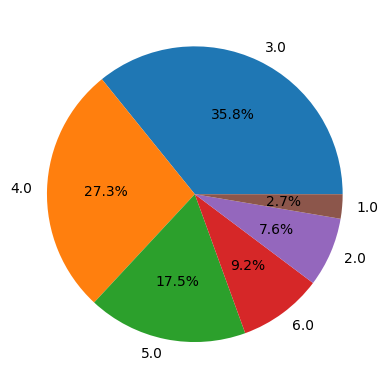

In [88]:
plt.subplot
plt.pie(dataframe["tier"].value_counts(),labels=[3.0,4.0,5.0,6.0,2.0,1.0], autopct='%1.1f%%')

In [89]:
dataframe["tier"]=dataframe["tier"].fillna(np.random.choice([3.0,4.0,5.0,6.0,2.0,1.0], p=[0.358, 0.273, 0.175,0.092,0.076,0.026]),limit=34)
dataframe["tier"]=dataframe["tier"].fillna(np.random.choice([3.0,4.0,5.0,6.0,2.0,1.0], p=[0.358, 0.273, 0.175,0.092,0.076,0.026]),limit=26)
dataframe["tier"]=dataframe["tier"].fillna(np.random.choice([3.0,4.0,5.0,6.0,2.0,1.0], p=[0.358, 0.273, 0.175,0.092,0.076,0.026]),limit=17)
dataframe["tier"]=dataframe["tier"].fillna(np.random.choice([3.0,4.0,5.0,6.0,2.0,1.0], p=[0.358, 0.273, 0.175,0.092,0.076,0.026]),limit=9)
dataframe["tier"]=dataframe["tier"].fillna(np.random.choice([3.0,4.0,5.0,6.0,2.0,1.0], p=[0.358, 0.273, 0.175,0.092,0.076,0.026]),limit=7)
dataframe["tier"]=dataframe["tier"].fillna(np.random.choice([3.0,4.0,5.0,6.0,2.0,1.0], p=[0.358, 0.273, 0.175,0.092,0.076,0.026]),limit=3)

In [90]:
dataframe["tier"].value_counts()

tier
3.0    7991
4.0    6125
5.0    3949
6.0    2054
2.0    1694
1.0     594
Name: count, dtype: int64

In [91]:
dataframe.isnull().sum()

ID                            0
lsat                          0
ugpa                          0
grad                          0
zgpa                       1289
fulltime                      0
fam_inc                     289
gender                        0
male                          0
race1                         0
Dropout                       0
other                         0
asian                         0
black                         0
hisp                          0
pass_bar                      0
tier                          0
indxgrp                       0
indxgrp2                      0
dnn_bar_pass_prediction       0
gpa                           0
dtype: int64

Con fam_inc hagamos algo parecido a lo que hicimos con el KNNimputer, es decir, vamos a tomar la media e cogeremos el más cercano.

In [92]:
dataframe["fam_inc"].value_counts()

fam_inc
4.0    9771
3.0    7896
2.0    2183
5.0    1814
1.0     454
Name: count, dtype: int64

In [93]:
knn_imputer = KNNImputer(n_neighbors=3,missing_values=np.nan,weights="uniform")
imputed_data = knn_imputer.fit_transform(dataframe[["fam_inc"]])
imputed_data=imputed_data.round(0)

In [94]:
np.unique(imputed_data,return_counts=True)

(array([1., 2., 3., 4., 5.]),
 array([ 454, 2183, 8185, 9771, 1814], dtype=int64))

In [95]:
dataframe["fam_inc"]=dataframe["fam_inc"].fillna(3.0)

In [96]:
dataframe.isnull().sum()

ID                            0
lsat                          0
ugpa                          0
grad                          0
zgpa                       1289
fulltime                      0
fam_inc                       0
gender                        0
male                          0
race1                         0
Dropout                       0
other                         0
asian                         0
black                         0
hisp                          0
pass_bar                      0
tier                          0
indxgrp                       0
indxgrp2                      0
dnn_bar_pass_prediction       0
gpa                           0
dtype: int64

Parece que la normalización que se hizo respecto al ugpa no se hizo de manera correcta. Faltando datos, es decir, algunas instancias de ugpa no pasaron a zgpa.

In [97]:
dataframe[dataframe["zgpa"].isnull()]

,ID,lsat,ugpa,grad,zgpa,fulltime,fam_inc,gender,male,race1,...,other,asian,black,hisp,pass_bar,tier,indxgrp,indxgrp2,dnn_bar_pass_prediction,gpa
19,268,39.0,3.5,Y,NaN,1.0,3.0,female,0.0,white,...,0,0,0,0,1,3.0,7,7,0.979804,3.5
50,647,34.0,3.5,Y,NaN,1.0,3.0,female,0.0,white,...,0,0,0,0,1,5.0,7,7,0.979804,3.5
62,823,33.0,3.5,Y,NaN,1.0,3.0,male,1.0,white,...,0,0,0,0,0,2.0,7,7,0.979804,3.5
68,894,40.0,3.5,Y,NaN,1.0,3.0,female,0.0,white,...,0,0,0,0,1,3.0,7,7,0.979804,3.5
75,1081,36.0,3.5,Y,NaN,1.0,4.0,female,0.0,white,...,0,0,0,0,1,3.0,7,7,0.979804,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22324,14583,27.0,2.1,X,NaN,2.0,2.0,female,0.0,black,...,0,0,1,0,0,3.0,3,3,0.899896,2.1
22341,18291,32.0,2.1,X,NaN,2.0,5.0,male,1.0,asian,...,0,1,0,0,0,4.0,4,4,0.899896,2.1
22379,16126,33.0,1.9,Y,NaN,2.0,4.0,male,1.0,white,...,0,0,0,0,1,5.0,4,4,0.857193,1.9
22382,19746,31.5,1.9,Y,NaN,1.0,3.0,female,0.0,white,...,0,0,0,0,1,1.0,4,4,0.857193,1.9


In [98]:
from sklearn import preprocessing
x = dataframe["gpa"].values #returns a numpy array
x=x.reshape(-1,1)
scaler = preprocessing.StandardScaler()
x_scaled =scaler.fit_transform(x)
df = pd.DataFrame(x_scaled)

In [99]:
dataframe["zgpa"].value_counts()

zgpa
 0.00    189
 0.10    116
 0.32    111
-0.12    109
 0.04    104
        ... 
 2.70      1
 2.49      1
-3.04      1
-3.00      1
 3.45      1
Name: count, Length: 588, dtype: int64

In [100]:
df=df.round(2)

Vemos que no es una normalización de ugpa o gpa, aunque si vimos que tenian bastante relación ¿Es posible que sea gpa de ciertos alumnos? Puede que sea el gpa de ciertos alumnos de una clase o año o edad. La verdad es que parece interesante mantenerlo aunque no sepa exactamente que es. Tampoco aparece en el pdf aunque sí se menciona un LGPA estandarizado y ajustado. Podría referirse a esto.

En todo caso, vamos a usar esta forma normal de ciertos datos, que no resulta tan alejada de los anteriores.

In [101]:
df

,0
0,0.70
1,0.70
2,0.70
3,0.70
4,0.70
...,...
22402,-3.50
22403,-3.50
22404,-3.50
22405,-4.25


In [102]:
df=pd.DataFrame(df.values,columns=["zgpa"])

In [103]:
df

,zgpa
0,0.70
1,0.70
2,0.70
3,0.70
4,0.70
...,...
22402,-3.50
22403,-3.50
22404,-3.50
22405,-4.25


In [104]:
dataframe["zgpa"]=dataframe["zgpa"].fillna(df["zgpa"])

In [105]:
dataframe.isnull().sum()

ID                         0
lsat                       0
ugpa                       0
grad                       0
zgpa                       0
fulltime                   0
fam_inc                    0
gender                     0
male                       0
race1                      0
Dropout                    0
other                      0
asian                      0
black                      0
hisp                       0
pass_bar                   0
tier                       0
indxgrp                    0
indxgrp2                   0
dnn_bar_pass_prediction    0
gpa                        0
dtype: int64

Ya tenemos un dataframe con el que trabajar. Más o menos. Me gustaria crear a partir de la columna race1 otra columna binaria de white.

In [106]:
df_blancos=pd.get_dummies(dataframe["race1"])

In [107]:
df_blancos["white"]=df_blancos["white"].astype(int)

In [108]:
dataframe_def=pd.concat([dataframe,df_blancos["white"]],axis=1)

In [109]:
dataframe_def

,ID,lsat,ugpa,grad,zgpa,fulltime,fam_inc,gender,male,race1,...,asian,black,hisp,pass_bar,tier,indxgrp,indxgrp2,dnn_bar_pass_prediction,gpa,white
0,2,44.0,3.5,Y,1.88,1.0,5.0,female,0.0,white,...,0,0,0,1,4.0,7,7,0.979804,3.5,1
1,3,29.0,3.5,Y,-0.57,1.0,4.0,female,0.0,white,...,0,0,0,1,2.0,6,6,0.979804,3.5,1
2,36,36.0,3.5,Y,-1.12,1.0,1.0,male,1.0,white,...,0,0,0,1,3.0,7,7,0.979804,3.5,1
3,52,39.0,3.5,Y,-0.49,1.0,4.0,male,1.0,white,...,0,0,0,1,3.0,7,7,0.979804,3.5,1
4,55,48.0,3.5,Y,0.76,1.0,4.0,male,1.0,white,...,0,0,0,1,5.0,7,7,0.979804,3.5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22402,10695,26.5,1.8,Y,-1.49,1.0,2.0,male,1.0,black,...,0,1,0,0,1.0,2,2,0.557568,1.8,0
22403,19642,19.7,1.8,Y,-1.36,1.0,3.0,male,1.0,black,...,0,1,0,0,1.0,1,1,0.557568,1.8,0
22404,24704,36.0,1.8,Y,0.80,2.0,3.0,male,1.0,black,...,0,1,0,1,3.0,5,5,0.557568,1.8,0
22405,10000,44.0,1.5,Y,1.42,2.0,3.0,male,1.0,white,...,0,0,0,1,3.0,6,6,0.759128,1.5,1


In [110]:
dataframe_def.columns

Index(['ID', 'lsat', 'ugpa', 'grad', 'zgpa', 'fulltime', 'fam_inc', 'gender',
       'male', 'race1', 'Dropout', 'other', 'asian', 'black', 'hisp',
       'pass_bar', 'tier', 'indxgrp', 'indxgrp2', 'dnn_bar_pass_prediction',
       'gpa', 'white'],
      dtype='object')

In [111]:
dataframe_def=dataframe_def[['ID', 'lsat', 'ugpa', 'grad', 'zgpa', 'fulltime', 'fam_inc', 'gender',
       'male', 'race1', 'Dropout', 'white', 'other', 'asian', 'black', 'hisp',
       'pass_bar', 'tier', 'indxgrp', 'indxgrp2', 'dnn_bar_pass_prediction',
       'gpa']]

In [112]:
dataframe_def.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22407 entries, 0 to 22406
Data columns (total 22 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       22407 non-null  int64  
 1   lsat                     22407 non-null  float64
 2   ugpa                     22407 non-null  float64
 3   grad                     22407 non-null  object 
 4   zgpa                     22407 non-null  float64
 5   fulltime                 22407 non-null  float64
 6   fam_inc                  22407 non-null  float64
 7   gender                   22407 non-null  object 
 8   male                     22407 non-null  float64
 9   race1                    22407 non-null  object 
 10  Dropout                  22407 non-null  object 
 11  white                    22407 non-null  int32  
 12  other                    22407 non-null  int64  
 13  asian                    22407 non-null  int64  
 14  black                 

In [113]:
dataframe_def["white"]=dataframe_def["white"].astype("float64")

Quitemos por último las columnas que repitan info y no sean númericas (race1 y gender). Aparte hay que convertir a númerico grad y Dropout.

In [114]:
dataframe_def=dataframe_def.drop(["gender","race1"],axis=1)

In [115]:
dataframe_def["Dropout"].value_counts()

Dropout
NO     22406
YES        1
Name: count, dtype: int64

In [116]:
dataframe_def["Dropout"]=(dataframe_def['Dropout'] == 'NO').astype(int)

Parece que la columna grad podriamos convertirla en binario, ya que solo hay una instancia de un caso diferente a Y o X.

In [117]:
dataframe_def["grad"].value_counts()

grad
Y    22318
X       88
O        1
Name: count, dtype: int64

In [118]:
dataframe_def[dataframe_def["grad"]=="O"]

,ID,lsat,ugpa,grad,zgpa,fulltime,fam_inc,male,Dropout,white,other,asian,black,hisp,pass_bar,tier,indxgrp,indxgrp2,dnn_bar_pass_prediction,gpa
7020,11929,39.5,3.2,O,-0.04,1.0,4.0,0.0,0,1.0,0,0,0,0,1,3.0,7,7,0.996526,3.2


In [119]:
dataframe_def.drop(7020)

,ID,lsat,ugpa,grad,zgpa,fulltime,fam_inc,male,Dropout,white,other,asian,black,hisp,pass_bar,tier,indxgrp,indxgrp2,dnn_bar_pass_prediction,gpa
0,2,44.0,3.5,Y,1.88,1.0,5.0,0.0,1,1.0,0,0,0,0,1,4.0,7,7,0.979804,3.5
1,3,29.0,3.5,Y,-0.57,1.0,4.0,0.0,1,1.0,0,0,0,0,1,2.0,6,6,0.979804,3.5
2,36,36.0,3.5,Y,-1.12,1.0,1.0,1.0,1,1.0,0,0,0,0,1,3.0,7,7,0.979804,3.5
3,52,39.0,3.5,Y,-0.49,1.0,4.0,1.0,1,1.0,0,0,0,0,1,3.0,7,7,0.979804,3.5
4,55,48.0,3.5,Y,0.76,1.0,4.0,1.0,1,1.0,0,0,0,0,1,5.0,7,7,0.979804,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22402,10695,26.5,1.8,Y,-1.49,1.0,2.0,1.0,1,0.0,0,0,1,0,0,1.0,2,2,0.557568,1.8
22403,19642,19.7,1.8,Y,-1.36,1.0,3.0,1.0,1,0.0,0,0,1,0,0,1.0,1,1,0.557568,1.8
22404,24704,36.0,1.8,Y,0.80,2.0,3.0,1.0,1,0.0,0,0,1,0,1,3.0,5,5,0.557568,1.8
22405,10000,44.0,1.5,Y,1.42,2.0,3.0,1.0,1,1.0,0,0,0,0,1,3.0,6,6,0.759128,1.5


In [120]:
dataframe_def.reindex()

,ID,lsat,ugpa,grad,zgpa,fulltime,fam_inc,male,Dropout,white,other,asian,black,hisp,pass_bar,tier,indxgrp,indxgrp2,dnn_bar_pass_prediction,gpa
0,2,44.0,3.5,Y,1.88,1.0,5.0,0.0,1,1.0,0,0,0,0,1,4.0,7,7,0.979804,3.5
1,3,29.0,3.5,Y,-0.57,1.0,4.0,0.0,1,1.0,0,0,0,0,1,2.0,6,6,0.979804,3.5
2,36,36.0,3.5,Y,-1.12,1.0,1.0,1.0,1,1.0,0,0,0,0,1,3.0,7,7,0.979804,3.5
3,52,39.0,3.5,Y,-0.49,1.0,4.0,1.0,1,1.0,0,0,0,0,1,3.0,7,7,0.979804,3.5
4,55,48.0,3.5,Y,0.76,1.0,4.0,1.0,1,1.0,0,0,0,0,1,5.0,7,7,0.979804,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22402,10695,26.5,1.8,Y,-1.49,1.0,2.0,1.0,1,0.0,0,0,1,0,0,1.0,2,2,0.557568,1.8
22403,19642,19.7,1.8,Y,-1.36,1.0,3.0,1.0,1,0.0,0,0,1,0,0,1.0,1,1,0.557568,1.8
22404,24704,36.0,1.8,Y,0.80,2.0,3.0,1.0,1,0.0,0,0,1,0,1,3.0,5,5,0.557568,1.8
22405,10000,44.0,1.5,Y,1.42,2.0,3.0,1.0,1,1.0,0,0,0,0,1,3.0,6,6,0.759128,1.5


In [121]:
dataframe_def["grad"]=(dataframe_def['grad'] == 'Y').astype(int)

In [122]:
dataframe_def

,ID,lsat,ugpa,grad,zgpa,fulltime,fam_inc,male,Dropout,white,other,asian,black,hisp,pass_bar,tier,indxgrp,indxgrp2,dnn_bar_pass_prediction,gpa
0,2,44.0,3.5,1,1.88,1.0,5.0,0.0,1,1.0,0,0,0,0,1,4.0,7,7,0.979804,3.5
1,3,29.0,3.5,1,-0.57,1.0,4.0,0.0,1,1.0,0,0,0,0,1,2.0,6,6,0.979804,3.5
2,36,36.0,3.5,1,-1.12,1.0,1.0,1.0,1,1.0,0,0,0,0,1,3.0,7,7,0.979804,3.5
3,52,39.0,3.5,1,-0.49,1.0,4.0,1.0,1,1.0,0,0,0,0,1,3.0,7,7,0.979804,3.5
4,55,48.0,3.5,1,0.76,1.0,4.0,1.0,1,1.0,0,0,0,0,1,5.0,7,7,0.979804,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22402,10695,26.5,1.8,1,-1.49,1.0,2.0,1.0,1,0.0,0,0,1,0,0,1.0,2,2,0.557568,1.8
22403,19642,19.7,1.8,1,-1.36,1.0,3.0,1.0,1,0.0,0,0,1,0,0,1.0,1,1,0.557568,1.8
22404,24704,36.0,1.8,1,0.80,2.0,3.0,1.0,1,0.0,0,0,1,0,1,3.0,5,5,0.557568,1.8
22405,10000,44.0,1.5,1,1.42,2.0,3.0,1.0,1,1.0,0,0,0,0,1,3.0,6,6,0.759128,1.5


Vamos a ver la importancia que tiene cada feature, a ver si vemos alguna columna más que podamos quitar según si tienen un mismo score.

Tambien será una herramienta interesante para ver si las columnas que nos dan información sobre razas es determinante.

In [123]:
from sklearn.feature_selection import SelectKBest

sel = SelectKBest(k=10)
X_new = sel.fit_transform(dataframe_def.drop(["dnn_bar_pass_prediction","pass_bar"],axis=1), dataframe_def["pass_bar"])
print(X_new.shape)
print(sel.scores_)

pd.DataFrame({'column': ['ID', 'lsat', 'ugpa', 'grad', 'zgpa', 'fulltime', 'fam_inc', 'male',
       'Dropout', 'white', 'other', 'asian', 'black', 'hisp',
       'tier', 'indxgrp', 'indxgrp2', 'gpa'], 'score': sel.scores_}).sort_values('score', ascending=False)

(22407, 10)
[1.49661347e-01 1.35067594e+03 4.69571550e+02 8.57954636e+01
 1.77603429e+03 9.96478530e+01 1.44286510e+02 1.11337453e+01
 5.50405085e-02 8.17989653e+02 2.16808103e+01 1.26492190e+01
 8.64216891e+02 3.54340564e+01 2.15967761e+02 2.07060681e+03
 2.07060681e+03 4.69571550e+02]


,column,score
16,indxgrp2,2070.606810
15,indxgrp,2070.606810
4,zgpa,1776.034289
1,lsat,1350.675937
12,black,864.216891
9,white,817.989653
17,gpa,469.571550
2,ugpa,469.571550
14,tier,215.967761
6,fam_inc,144.286510


Podemos quitar indxgrp2 que es igual a indxgrp. Tambien podemos quitar ugpa que es igual a gpa. 

In [128]:
dataframe_def["indxgrp"].equals(dataframe_def["indxgrp2"])

True

In [132]:
dataframe_def["gpa"].equals(dataframe_def["ugpa"])

True

In [130]:
dataframe_def=dataframe_def.drop(["indxgrp2"],axis=1)

In [133]:
dataframe_def=dataframe_def.drop(["ugpa"],axis=1)

Ya tenemos el dataframe definitivo para empezar a trabajar el modelo.

In [134]:
dataframe_def

,ID,lsat,grad,zgpa,fulltime,fam_inc,male,Dropout,white,other,asian,black,hisp,pass_bar,tier,indxgrp,dnn_bar_pass_prediction,gpa
0,2,44.0,1,1.88,1.0,5.0,0.0,1,1.0,0,0,0,0,1,4.0,7,0.979804,3.5
1,3,29.0,1,-0.57,1.0,4.0,0.0,1,1.0,0,0,0,0,1,2.0,6,0.979804,3.5
2,36,36.0,1,-1.12,1.0,1.0,1.0,1,1.0,0,0,0,0,1,3.0,7,0.979804,3.5
3,52,39.0,1,-0.49,1.0,4.0,1.0,1,1.0,0,0,0,0,1,3.0,7,0.979804,3.5
4,55,48.0,1,0.76,1.0,4.0,1.0,1,1.0,0,0,0,0,1,5.0,7,0.979804,3.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22402,10695,26.5,1,-1.49,1.0,2.0,1.0,1,0.0,0,0,1,0,0,1.0,2,0.557568,1.8
22403,19642,19.7,1,-1.36,1.0,3.0,1.0,1,0.0,0,0,1,0,0,1.0,1,0.557568,1.8
22404,24704,36.0,1,0.80,2.0,3.0,1.0,1,0.0,0,0,1,0,1,3.0,5,0.557568,1.8
22405,10000,44.0,1,1.42,2.0,3.0,1.0,1,1.0,0,0,0,0,1,3.0,6,0.759128,1.5


In [136]:
dataframe_def["dnn_bar_pass_prediction"]

0        0.979804
1        0.979804
2        0.979804
3        0.979804
4        0.979804
           ...   
22402    0.557568
22403    0.557568
22404    0.557568
22405    0.759128
22406    0.330740
Name: dnn_bar_pass_prediction, Length: 22407, dtype: float64

Tambien vamos a quitar la columna de dnn_bar_pass_prediction, que es la columna con la probabilidad de predicciones de otro modelo. Un dato que al modelo no le va a interesar.

In [137]:
dataframe_def=dataframe_def.drop(["dnn_bar_pass_prediction"],axis=1)

In [138]:
dataframe_def.to_csv("../data/processed/datos_procesados.csv",index=False)